In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sb
import os
from glob import glob
import cv2
import warnings
warnings.filterwarnings('ignore')

import albumentations as A

In [3]:
df = pd.read_csv('../data/intro-dl-2024/train.csv')
df.shape

(8144, 3)

In [4]:
df.head()

,filename,label,classname
0,06796.jpg,0,Dodge Dakota Crew Cab 2010
1,04157.jpg,0,Dodge Dakota Crew Cab 2010
2,00682.jpg,0,Dodge Dakota Crew Cab 2010
3,07660.jpg,0,Dodge Dakota Crew Cab 2010
4,00483.jpg,0,Dodge Dakota Crew Cab 2010


In [5]:
print('Image count as per the metadata : ', len(df))
print('Image count as per the directory : ', len(glob('../data/intro-dl-2024/train/train/*')))

Image count as per the metadata :  8144
Image count as per the directory :  8144


In [6]:
def get_image_path(id):
    return f"../data/intro-dl-2024/train/train/{id}"

df["filename"] = df["filename"].apply(get_image_path)
df.head()

,filename,label,classname
0,../data/intro-dl-2024/train/train/06796.jpg,0,Dodge Dakota Crew Cab 2010
1,../data/intro-dl-2024/train/train/04157.jpg,0,Dodge Dakota Crew Cab 2010
2,../data/intro-dl-2024/train/train/00682.jpg,0,Dodge Dakota Crew Cab 2010
3,../data/intro-dl-2024/train/train/07660.jpg,0,Dodge Dakota Crew Cab 2010
4,../data/intro-dl-2024/train/train/00483.jpg,0,Dodge Dakota Crew Cab 2010


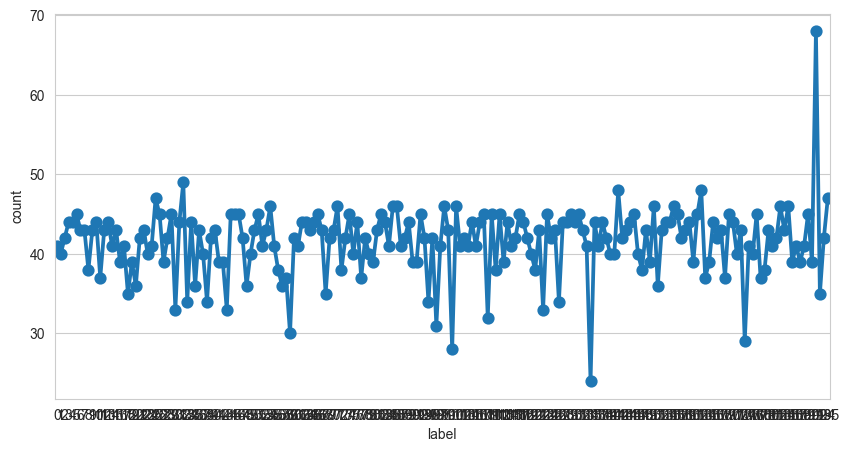

In [6]:
plt.figure(figsize=(10,5))
sb.pointplot(df['label'].value_counts())
plt.show()

### В целом классы сбалансированные

TRAIN DATA


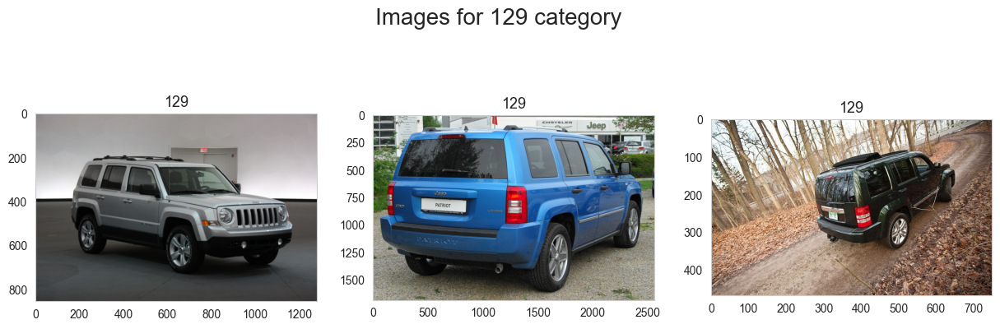

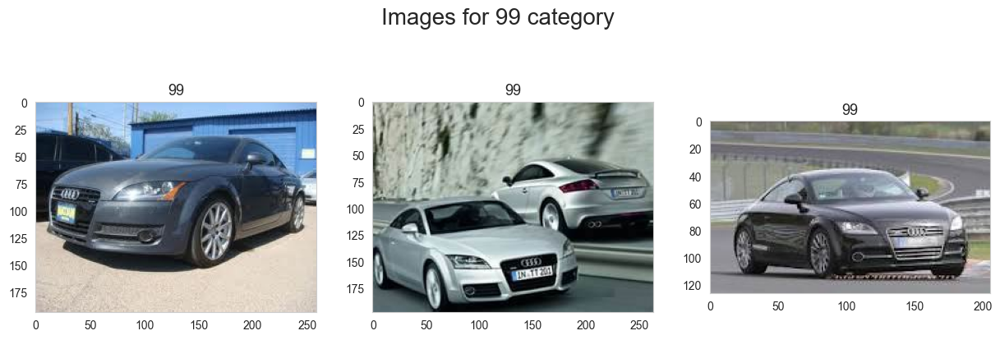

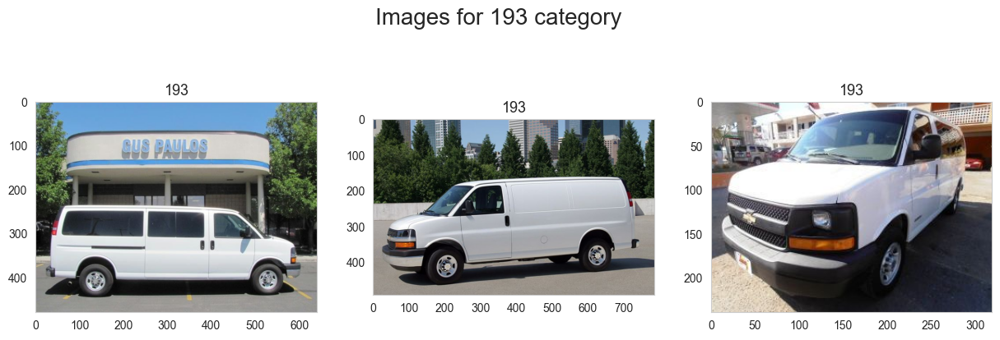

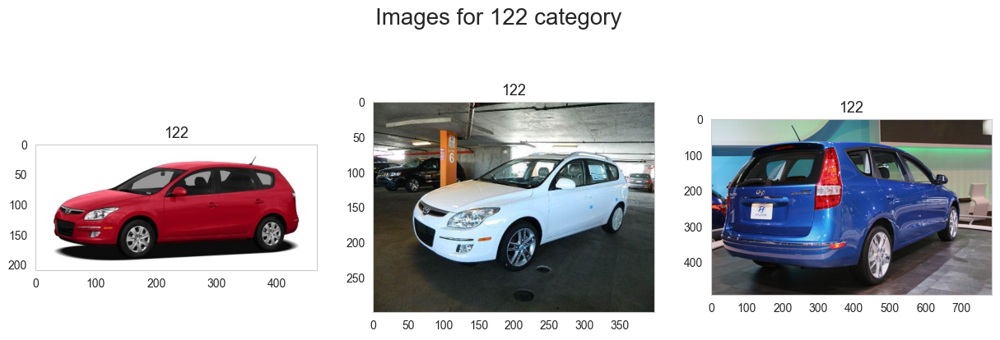

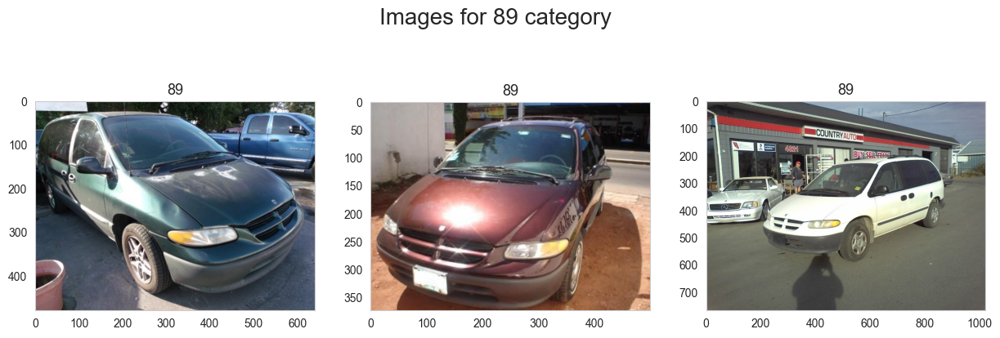

In [7]:
base_path = '../data/intro-dl-2024/train/train'
categories = df["label"].unique()

print("TRAIN DATA")
for cat in categories[np.random.choice(len(categories), 5)]:
    cat_specific = df[df['label']==cat]

    index_list = cat_specific.index
    fig, ax = plt.subplots(1, 3, figsize=(15,5))
    fig.suptitle(f'Images for {cat} category', fontsize=20)
    for i in range(3):
        index = np.random.randint(0,len(index_list))
        index = index_list[index]
        data = df.iloc[index]

        image_path = data[0]
        img = cv2.imread(image_path)

        if len(img.shape) == 2:
            img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
        else:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        ax[i].grid(False)
        ax[i].imshow(img)
        ax[i].set_title(cat, fontsize=13)

    plt.show()

In [9]:
base_path = '../data/intro-dl-2024/test/test'
df = pd.read_csv('../data/intro-dl-2024/sample_submission.csv')

In [10]:
def get_image_path(id):
    return f"../data/intro-dl-2024/test/test/{id}"

df["filename"] = df["filename"].apply(get_image_path)
df.head()

,filename,label
0,../data/intro-dl-2024/test/test/00143.jpg,0
1,../data/intro-dl-2024/test/test/07491.jpg,131
2,../data/intro-dl-2024/test/test/05431.jpg,115
3,../data/intro-dl-2024/test/test/03131.jpg,163
4,../data/intro-dl-2024/test/test/05998.jpg,4


TEST DATA


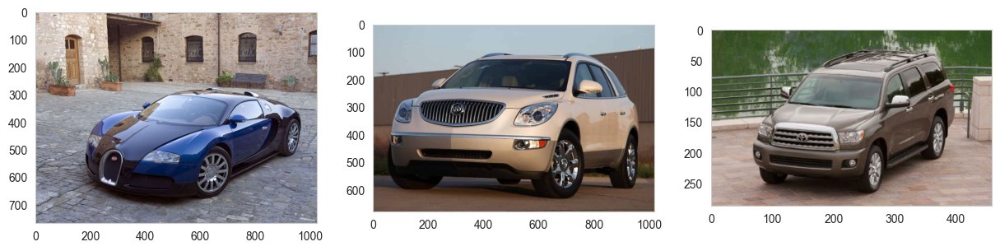

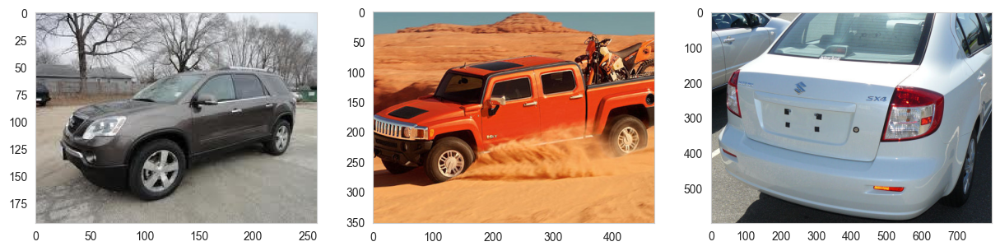

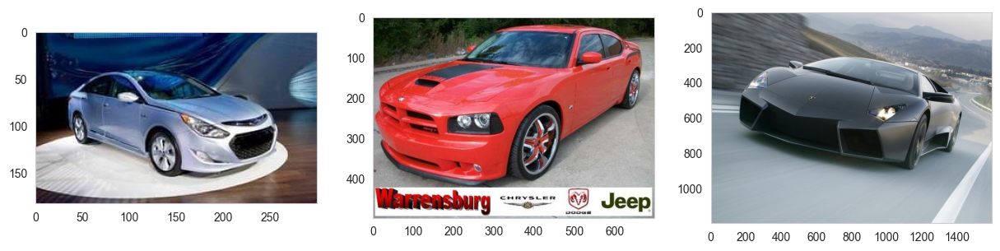

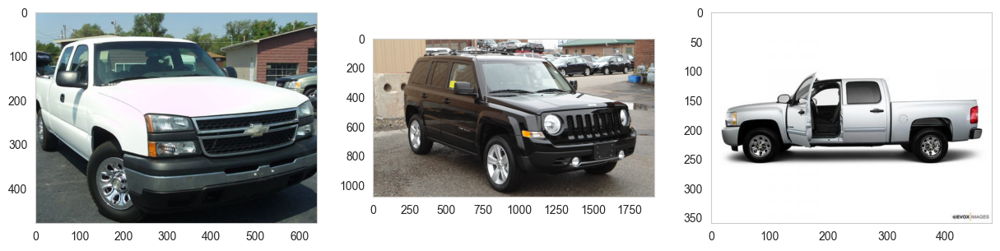

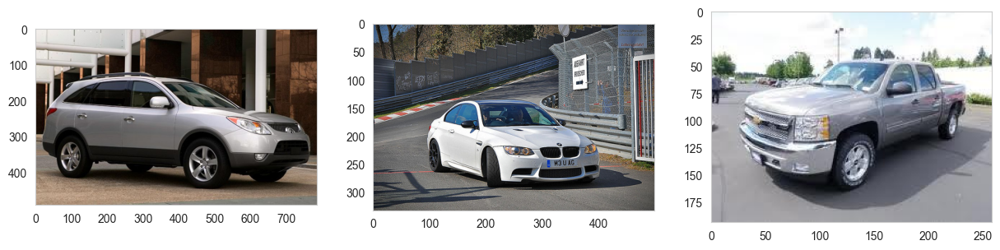

In [11]:
print("TEST DATA")
for i in range(5):
    fig, ax = plt.subplots(1, 3, figsize=(15,5))
    for i in range(3):
        index = np.random.randint(0, len(df))
        data = df.iloc[index]

        image_path = data[0]
        img = cv2.imread(image_path)

        if len(img.shape) == 2:
            img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
        else:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        ax[i].grid(False)
        ax[i].imshow(img)

    plt.show()

## Аугментации

In [2]:
train_aug = A.Compose(
    [
        A.HorizontalFlip(p=0.5),
        A.Blur(p=0.5),
        A.RandomBrightnessContrast(p=0.5),
        A.CLAHE(p=0.5),
        A.ChannelShuffle(p=0.5),
        A.ColorJitter(p=0.5),
        A.ChannelDropout(p=0.5),
        A.RandomGamma(p=0.5),
        A.RGBShift(p=0.5),
        A.GaussNoise(p=0.5),
        A.HueSaturationValue(p=0.5),
    ]
)

AUG TEST DATA


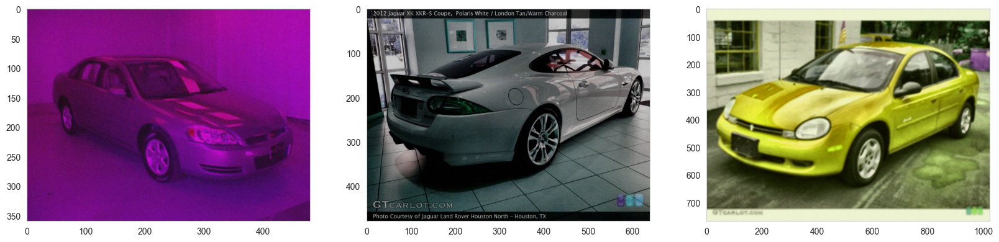

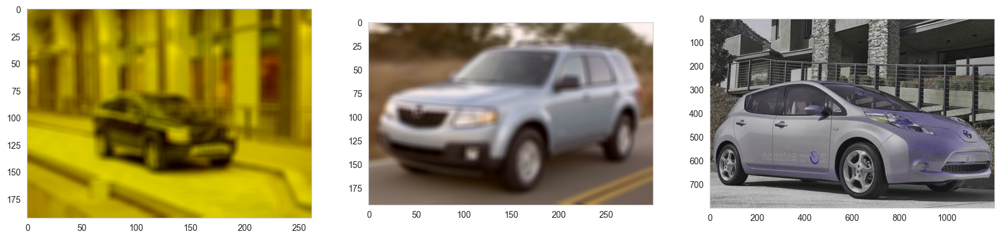

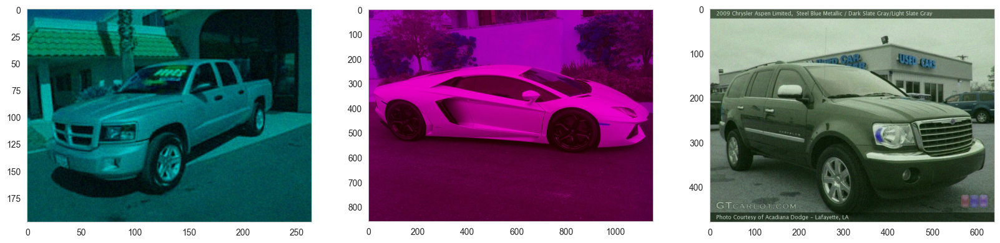

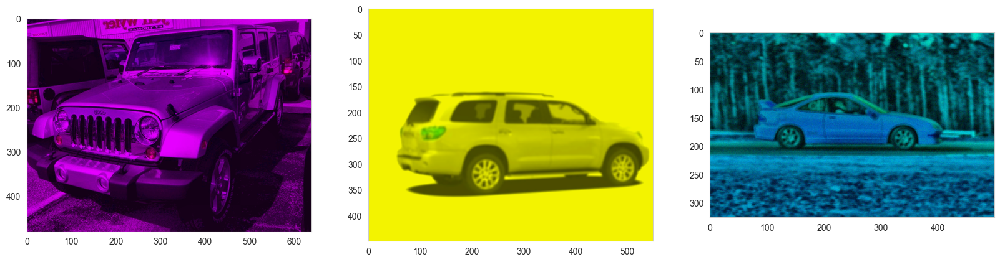

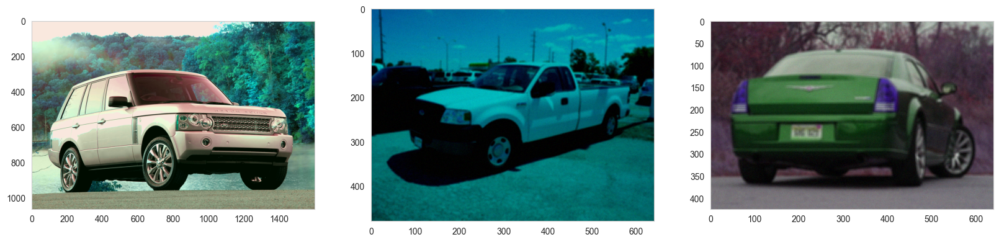

In [15]:
print("AUG TEST DATA")
for i in range(5):
    fig, ax = plt.subplots(1, 3, figsize=(20,8))
    for i in range(3):
        index = np.random.randint(0, len(df))
        data = df.iloc[index]

        image_path = data[0]
        img = cv2.imread(image_path)

        if len(img.shape) == 2:
            img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
        else:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        ax[i].grid(False)
        ax[i].imshow(train_aug(image=img)["image"])

    plt.show()